# Visualization of the uncertainty maps

In [2]:
from pathlib import Path
import SimpleITK as sitk
import numpy as np
import matplotlib.pyplot as plt
import sqlite3
import pandas as pd

from scipy.ndimage import binary_dilation
from typing import List, Tuple, Dict, Union, Optional

from assets.dicom_utils import resample_to_reference
# from assets.uncertainty_quantification import apply_percentile_threshold
from assets.image_operations import apply_gaussian_blur_3d, adaptive_clip


#################
# Have you first generated the uncertainty maps with the `e2_generate_uncertainty_maps.py` script?

# This script makes a nice image grid of the uncertainty maps and the recons for each patient.
#################


ROOTS = {
    'kspace':             Path('/scratch/p290820/datasets/003_umcg_pst_ksps'),
    'reader_study':       Path('/scratch/hb-pca-rad/projects/03_reader_set_v2'),
    'reader_study_segs':  Path('/scratch/hb-pca-rad/projects/03_reader_set_v2/segs'),
    'R3_recons_gaussian': Path(f"/scratch/hb-pca-rad/projects/04_uncertainty_quantification/gaussian/recons_{3}x"),
    'R6_recons_gaussian': Path(f"/scratch/hb-pca-rad/projects/04_uncertainty_quantification/gaussian/recons_{6}x"),
    'R3_recons_lxo':      Path(f"/scratch/hb-pca-rad/projects/04_uncertainty_quantification/lxo/recons_{3}x"),
    'R6_recons_lxo':      Path(f"/scratch/hb-pca-rad/projects/04_uncertainty_quantification/lxo/recons_{6}x"),
    'db_fpath_old':       Path('/scratch/p290820/datasets/003_umcg_pst_ksps/database/dbs/master_habrok_20231106_v2.db'),                  # References an OLDER version of the databases where the info could also just be fine that we are looking for
    'db_fpath_new':       Path('/home1/p290820/repos/Uncertainty-Quantification-Prostate-MRI/databases/master_habrok_20231106_v2.db'),    # References the LATEST version of the databases where the info could also just be fine that we are looking for
    # 'figures':           Path(f"/scratch/hb-pca-rad/projects/04_uncertainty_quantification/figures_std_v2"),
}

# === Configurable Params ===
TABLENAME         = 'uq_vs_error_correlation_std'
EXAMPLE_SLICE_IDX = 10                              # The slice index to use for the example slice in the figure.
DEBUG             = True                            # Whether to run in debug mode, which will only plot a few patients.
DO_ADAP_CLIP      = True                            # Whether to apply adaptive clipping to the recons before plotting.
DO_BLURRING       = True                            # Whether to apply Gaussian blurring to the recons before plotting.
ACC_FACTORS       = [3, 6]                          # Define the set of acceleration factors we care about.
UQ_METHODS        = ['gaussian', 'lxo']             # Define the set of uncertainty quantification methods we care about.
REGIONS           = ['slice', 'prostate', 'lesion'] # Define the regions of interest we care about.
REGIONS           = ['slice'] # Define the regions of interest we care about.
DECIMALS          = 4                               # Number of decimals to round to
VLIMS = {                                           # Determined from the database query above, but can also be set manually.
    'abs_error_vmin': 0,       #6.0,    # determined from DB
    'abs_error_vmax': 75,      #41.0,   # determined from DB
    'uq_vmin':        0,       #0.0003, # determined from DB
    'uq_vmax':        0.20,    #0.003,  # determined from DB
}

# All patient IDs to consider for Uncertainty Quantification
PAT_IDS = [
        # '0003_ANON5046358',
        # '0004_ANON9616598',
        # '0005_ANON8290811',
        # '0006_ANON2379607',
        # '0007_ANON1586301',     # with lesions I think for testing.
        # '0008_ANON8890538',
        '0010_ANON7748752',
        # '0011_ANON1102778',
        '0012_ANON4982869',
        '0013_ANON7362087',
        # '0014_ANON3951049',
        # '0015_ANON9844606',
        # '0018_ANON9843837',
        # '0019_ANON7657657',
        # '0020_ANON1562419',
        # '0021_ANON4277586',
        # '0023_ANON6964611',
        # '0024_ANON7992094',
        # '0026_ANON3620419',
        # '0027_ANON9724912',   # here is 20
        # '0028_ANON3394777',
        # '0029_ANON7189994',
        # '0030_ANON3397001',
        # '0031_ANON9141039',
        # '0032_ANON7649583',
        # '0033_ANON9728185',
        # '0035_ANON3474225',
        # '0036_ANON0282755',
        # '0037_ANON0369080',
        # '0039_ANON0604912',
        # '0042_ANON9423619',
        # '0043_ANON7041133',
        # '0044_ANON8232550',
        # '0045_ANON2563804',
        # '0047_ANON3613611',
        # '0048_ANON6365688',
        # '0049_ANON9783006',
        # '0051_ANON1327674',
        # '0052_ANON9710044',
        # '0053_ANON5517301',
        # '0055_ANON3357872',
        # '0056_ANON2124757',
        # '0057_ANON1070291',
        # '0058_ANON9719981',
        # '0059_ANON7955208',
        # '0061_ANON7642254',
        # '0062_ANON0319974',
        # '0063_ANON9972960',
        # '0064_ANON0282398',
        # '0067_ANON0913099',
        # '0068_ANON7978458',
        # '0069_ANON9840567',
        # '0070_ANON5223499',
        # '0071_ANON9806291',
        # '0073_ANON5954143',
        # '0075_ANON5895496',
        # '0076_ANON3983890',
        # '0077_ANON8634437',
        # '0078_ANON6883869',
        # '0079_ANON8828023',
        # '0080_ANON4499321',
        # '0081_ANON9763928',
        # '0082_ANON6073234',
        # '0083_ANON9898497',
        # '0084_ANON6141178',
        # '0085_ANON4535412',
        # '0086_ANON8511628',
        # '0087_ANON9534873',
        # '0088_ANON9892116',
        # '0089_ANON9786899',
        # '0090_ANON0891692',
        # '0092_ANON9941969',
        # '0093_ANON9728761',
        # '0094_ANON8024204',
        # '0095_ANON4189062',
        # '0097_ANON5642073',
        # '0103_ANON8583296',
        # '0104_ANON7748630',
        # '0105_ANON9883201',
        # '0107_ANON4035085',
        # '0108_ANON0424679',
        # '0109_ANON9816976',
        # '0110_ANON8266491',
        # '0111_ANON9310466',
        # '0112_ANON3210850',
        # '0113_ANON9665113',
        # '0115_ANON0400743',
        # '0116_ANON9223478',
        # #'0118_ANON7141024',       We skip this patient because the LXO method does not seem to work for it on R6
        # '0119_ANON3865800',
        # '0120_ANON7275574',
        # '0121_ANON9629161',
        # '0123_ANON7265874',
        # '0124_ANON8610762',
        # '0125_ANON0272089',
        # '0126_ANON4747182',
        # '0127_ANON8023509',
        # '0128_ANON8627051',
        # '0129_ANON5344332',
        # '0135_ANON9879440',
        # '0136_ANON8096961',
        # '0137_ANON8035619',
        # '0138_ANON1747790',
        # '0139_ANON2666319',
        # '0140_ANON0899488',
        # '0141_ANON8018038',
        # '0142_ANON7090827',
        # '0143_ANON9752849',
        # '0144_ANON2255419',
        # '0145_ANON0335209',
        # '0146_ANON7414571',
        # '0148_ANON9604223',
        # '0149_ANON4712664',
        # '0150_ANON5824292',
        # '0152_ANON2411221',
        # '0153_ANON5958718',
        # '0155_ANON7828652',
        # '0157_ANON9873056',
        # '0159_ANON9720717',
        # '0160_ANON3504149'
    ]

# Check if all root paths exist
for root in ROOTS.values():
    if not root.exists():
        raise FileNotFoundError(f"Root path {root} does not exist. Please check the paths.")

# Determine the vmin and vmax for image visualization.

In [3]:
# === Query ===
query = f"""
SELECT acc_factor, uq_method, mean_abs, mean_uq
FROM {TABLENAME}
WHERE region = 'slice'
"""

# === Load into DataFrame ===
with sqlite3.connect(ROOTS['db_fpath_new']) as conn:
    df = pd.read_sql_query(query, conn)

# === Compute percentiles ===
vlims = {}
grouped = df.groupby(["acc_factor", "uq_method"])
for (acc, method), group in grouped:
    vlims[(acc, method)] = {
        "abs_vmin": np.percentile(group["mean_abs"], 2),
        "abs_vmax": np.percentile(group["mean_abs"], 98),
        "uq_vmin":  np.percentile(group["mean_uq"], 2),
        "uq_vmax":  np.percentile(group["mean_uq"], 98),
    }


def print_vlims(vlims_dict):
    for (acc, method), v in sorted(vlims_dict.items()):
        print(f"R={acc}, Method={method.upper()}")
        print(f"  ABS  : vmin={v['abs_vmin']:.2f}, vmax={v['abs_vmax']:.2f}")
        print(f"  UQ   : vmin={v['uq_vmin']:.5f}, vmax={v['uq_vmax']:.5f}")
        print("")

# Cast to plain float for JSON-compatibility
vlims_clean = {
    f"R{acc}_{method}": {
        "abs_vmin": float(v["abs_vmin"]),
        "abs_vmax": float(v["abs_vmax"]),
        "uq_vmin":  float(v["uq_vmin"]),
        "uq_vmax":  float(v["uq_vmax"]),
    }
    for (acc, method), v in vlims.items()
}

print_vlims(vlims)
# 🧭 What is Recommend?
# For scientific figures and cross-method comparisons:

# ✅ Use uniform ranges across all methods and R-values:

# abs_error_vmin = 6.0
# abs_error_vmax = 41.0
# uq_vmin = 0.0003
# uq_vmax = 0.0018
# For interactive or case-by-case visualizations:

# ✅ Allow per-method ranges, but clearly annotate the colorbar scale

R=3, Method=GAUSSIAN
  ABS  : vmin=6.20, vmax=40.79
  UQ   : vmin=0.00060, vmax=0.00177

R=3, Method=LXO
  ABS  : vmin=6.20, vmax=40.79
  UQ   : vmin=0.00042, vmax=0.00170

R=6, Method=GAUSSIAN
  ABS  : vmin=7.06, vmax=38.06
  UQ   : vmin=0.00059, vmax=0.00173

R=6, Method=LXO
  ABS  : vmin=7.06, vmax=38.06
  UQ   : vmin=0.00031, vmax=0.00124



# Helper fucntions for image grid visualization

In [4]:
# Helper functions
def _get_nonzero_slice_indexes(arr: np.ndarray) -> List[int]:
    """
    Get the indexes of all slices in a 3D array where the sum of the slice is not zero.

    Args:
        arr (np.ndarray): 3D array with shape (slices, rows, cols).

    Returns:
        List[int]: List of indexes of non-zero slices.
    """
    # Compute the sum of each slice along the (rows, cols) dimensions
    slice_sums = np.sum(arr, axis=(1, 2))
    
    # Get the indexes of slices where the sum is not zero
    nonzero_indexes = [i for i, s in enumerate(slice_sums) if s != 0]
    return nonzero_indexes


def _get_middle_index_of_nonzero_slices(arr: np.ndarray) -> int:
    """
    Get the middle index of all non-zero slices in a 3D array.

    Args:
        arr (np.ndarray): 3D array with shape (slices, rows, cols).

    Returns:
        int: Middle index of non-zero slices.
    """
    # Get the indexes of non-zero slices
    nonzero_indexes = _get_nonzero_slice_indexes(arr)
    
    # If no non-zero slices exist, return -1 or raise an exception
    if not nonzero_indexes:
        raise ValueError("No non-zero slices found in the array.")
    
    # Calculate the middle index
    middle_index = nonzero_indexes[len(nonzero_indexes) // 2]
    return middle_index


def _get_combined_rois_array(pat_root: Path, r1_ref_image: sitk.Image, r1_arr: np.ndarray) -> Tuple[np.ndarray, List[int]]:
    roi_fpaths = list(pat_root.glob("*_roi_*.mha"))
    roi_arrs_combined = np.zeros_like(r1_arr)
    if len(roi_fpaths) == 0:
        print(f"\tNo ROIs found in {pat_root.name}.")
        return roi_arrs_combined, []
    for roi_fpath in roi_fpaths:
        roi_img = sitk.ReadImage(str(roi_fpath))
        roi_img_resampled = resample_to_reference(roi_img, r1_ref_image)
        roi_arr = sitk.GetArrayFromImage(roi_img_resampled)
        roi_arrs_combined += roi_arr
    slice_idxs_lesion = [i for i in range(len(roi_arrs_combined)) if np.sum(roi_arrs_combined[i]) > 0]
    print(f"\tCombined ROI {roi_fpath.name} has {len(slice_idxs_lesion)} slices with lesions. With idxs: {slice_idxs_lesion}")
    return roi_arrs_combined, slice_idxs_lesion


def _get_topk_mask(arr, perc):
    thresh = np.percentile(arr, perc)
    return arr >= thresh


# ---------- fast dilation helpers ----------
def _dilate2d_fast(mask2d: np.ndarray,
                  radius: int = 3,
                  eight_conn: bool = False) -> np.ndarray:
    """Binary dilation of a 2-D slice (square footprint)."""
    assert mask2d.ndim == 2
    if eight_conn:
        footprint = np.ones((2*radius+1, 2*radius+1), dtype=bool)
    else:  # 4-connected cross
        eye = np.eye(2*radius+1, dtype=bool)
        footprint = eye | eye[::-1]
    return binary_dilation(mask2d, structure=footprint).astype(np.uint8)

# Image Grid 1 - See Reconstructions, Absolute Error and Uncertainty maps.

The goals is to see if the uncertainty map is correlated with the absoluate error map.
Especially in lesion locations.

We will first explore the following figure:
```
| R1          |      R3           |      R6          |

| R1 lesions  | Abs Error R3      | Abs Error R6     |

| Prost. seg. |   UQ map R3 gaus  |   UQ map R6 gaus |

| Prost. seg. |   UQ map R3 lxo   |   UQ map R6 lxo  |
```


	No ROIs found in 0010_ANON7748752.
Middle index of non-zero slices in prostate segmentation: 14
Using slice index 14 for patient 0010_ANON7748752


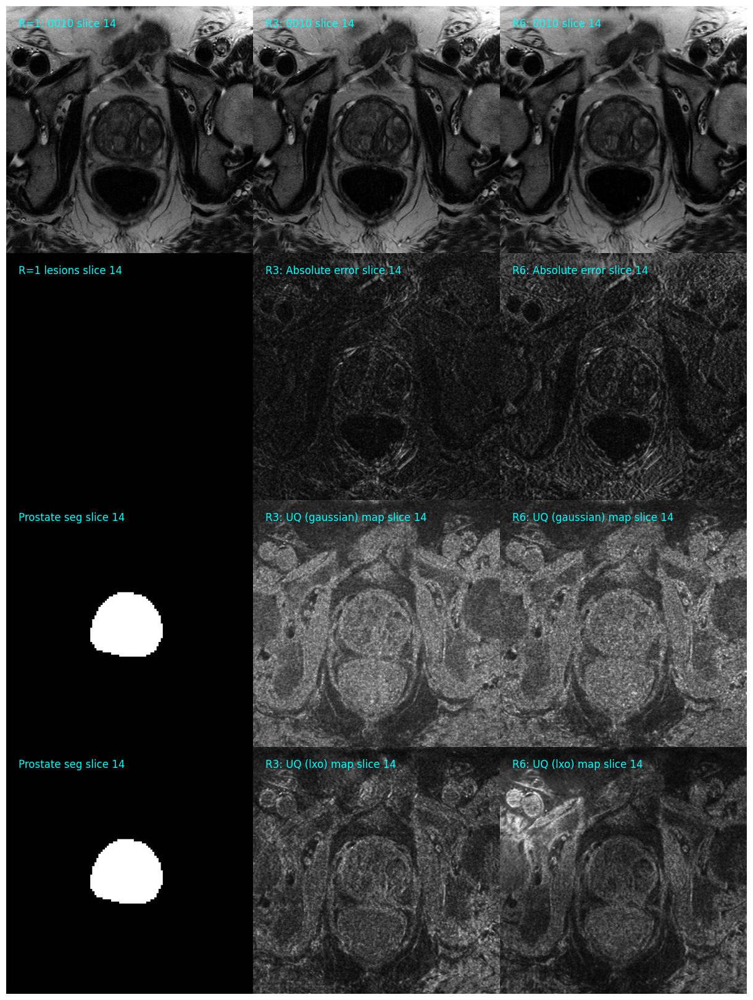

Figure saved to /scratch/hb-pca-rad/projects/04_uncertainty_quantification/figures_std_v2/0010_ANON7748752_UQ_vs_ABS_slice14_R1_R3_R6.png
	No ROIs found in 0012_ANON4982869.
Middle index of non-zero slices in prostate segmentation: 13
Using slice index 13 for patient 0012_ANON4982869


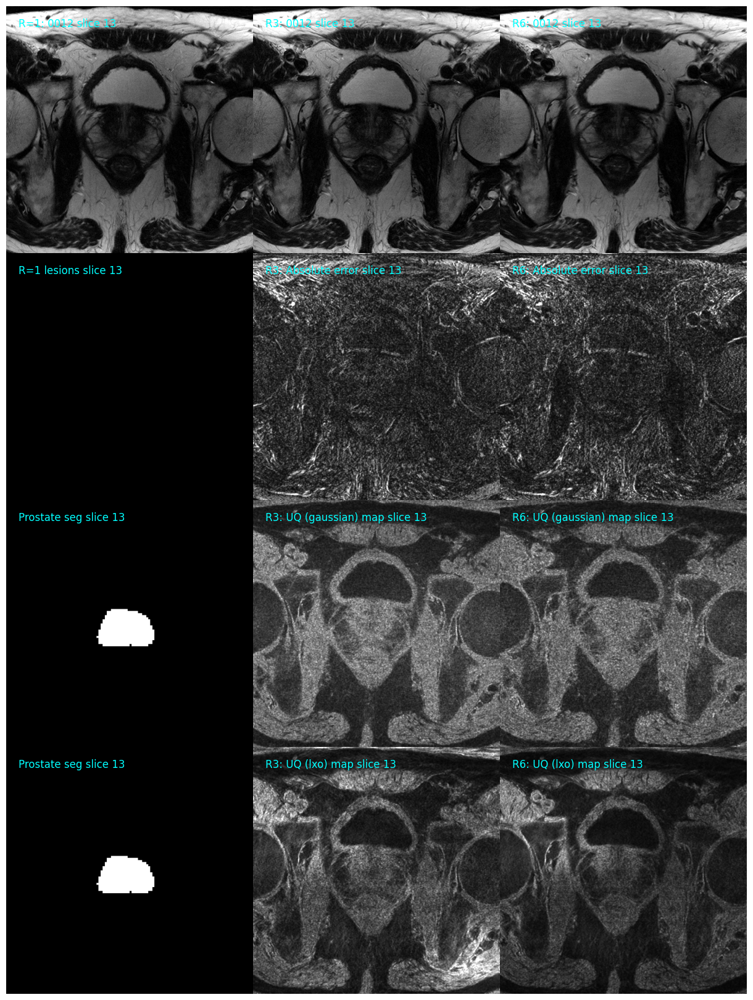

Figure saved to /scratch/hb-pca-rad/projects/04_uncertainty_quantification/figures_std_v2/0012_ANON4982869_UQ_vs_ABS_slice13_R1_R3_R6.png
	Combined ROI 0013_ANON7362087_roi_1_1.mha has 3 slices with lesions. With idxs: [11, 12, 13]
Middle index of non-zero slices in prostate segmentation: 13
Using slice index 11 for patient 0013_ANON7362087


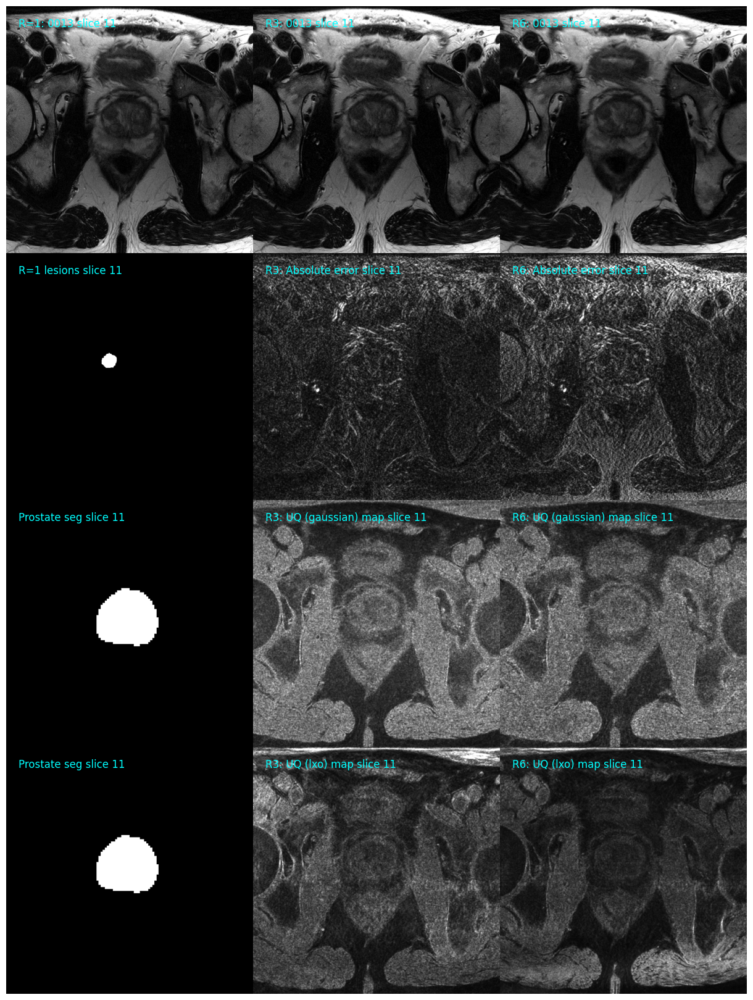

Figure saved to /scratch/hb-pca-rad/projects/04_uncertainty_quantification/figures_std_v2/0013_ANON7362087_UQ_vs_ABS_slice11_R1_R3_R6.png


In [ ]:
def plot_uq_vs_abs_grid(
    pat_id: str,
    slice_idx: int,
    roots: Dict[str, Path],
    do_adap_clip: bool                  = False,
    do_blurring: bool                   = False,
    do_show_now: bool                   = False,
    vlims: Dict[str, Union[float, int]] = None,
    figdir: Path                        = None,
):
    pat_root          = roots['reader_study'] / pat_id
    r1_img            = sitk.ReadImage(str(pat_root / f"{pat_id}_rss_target_dcml.mha"))
    r1_arr            = sitk.GetArrayFromImage(r1_img)
    roi_arr, les_idxs = _get_combined_rois_array(pat_root, r1_img, r1_arr)
    r1_empty_arr      = np.zeros_like(r1_arr)

    prostate_seg_root = roots['reader_study_segs'] / f"{pat_id}_mlseg_total_mr.nii.gz"
    prost_seg_arr     = sitk.GetArrayFromImage(sitk.ReadImage(str(prostate_seg_root))) # so this is a segmentation of many multi-label anatomical structures, where are interested in where it is the prostate=17
    prost_seg_arr     = np.where(prost_seg_arr == 17, 1, 0) # this is the prostate segmentation

    r3_arr            = sitk.GetArrayFromImage(sitk.ReadImage(str(pat_root / f"{pat_id}_VSharp_R3_recon_dcml.mha")))
    r3_abs_error_arr  = np.abs(r1_arr - r3_arr)
    r3_uq_map_arr_gau = sitk.GetArrayFromImage(sitk.ReadImage(str(roots["R3_recons_gaussian"] / pat_id / f"uq_map_R3_gaussian.nii.gz")))
    r3_uq_map_arr_lxo = sitk.GetArrayFromImage(sitk.ReadImage(str(roots["R3_recons_lxo"] / pat_id / f"uq_map_R3_lxo.nii.gz")))
    # r3_uq_thr         = apply_percentile_threshold(r3_uq_map_arr, percentile=perc_thr, debug=False)

    r6_arr            = sitk.GetArrayFromImage(sitk.ReadImage(str(pat_root / f"{pat_id}_VSharp_R6_recon_dcml.mha")))
    r6_abs_error_arr  = np.abs(r1_arr - r6_arr)
    r6_uq_map_arr_gau = sitk.GetArrayFromImage(sitk.ReadImage(str(roots["R6_recons_gaussian"] / pat_id / f"uq_map_R6_gaussian.nii.gz")))
    r6_uq_map_arr_lxo = sitk.GetArrayFromImage(sitk.ReadImage(str(roots["R6_recons_lxo"] / pat_id / f"uq_map_R6_lxo.nii.gz")))
    # r6_uq_thr         = apply_percentile_threshold(r6_uq_map_arr, percentile=perc_thr, debug=False)

    if do_blurring:
        r3_abs_error_arr  = apply_gaussian_blur_3d(r3_abs_error_arr, sigma_xy=1.0, sigma_z=0.0)
        r3_uq_map_arr_gau = apply_gaussian_blur_3d(r3_uq_map_arr_gau, sigma_xy=1.0, sigma_z=0.0)
        r3_uq_map_arr_lxo = apply_gaussian_blur_3d(r3_uq_map_arr_lxo, sigma_xy=1.0, sigma_z=0.0)
        
        r6_abs_error_arr  = apply_gaussian_blur_3d(r6_abs_error_arr, sigma_xy=1.0, sigma_z=0.0)
        r6_uq_map_arr_gau = apply_gaussian_blur_3d(r6_uq_map_arr_gau, sigma_xy=1.0, sigma_z=0.0)
        r6_uq_map_arr_lxo = apply_gaussian_blur_3d(r6_uq_map_arr_lxo, sigma_xy=1.0, sigma_z=0.0)

    if do_adap_clip:    # Purely for visualization purposes, to make the images look better.
        r1_arr = adaptive_clip(r1_arr)
        r3_arr = adaptive_clip(r3_arr)
        r6_arr = adaptive_clip(r6_arr)

    fig, axs = plt.subplots(4, 3, figsize=(12, 16))
    seq_id = pat_id.split('_')[0]

    grid = [
        [r1_arr,        r3_arr,            r6_arr],
        [roi_arr,       r3_abs_error_arr,  r6_abs_error_arr],
        [prost_seg_arr, r3_uq_map_arr_gau, r6_uq_map_arr_gau],
        [prost_seg_arr, r3_uq_map_arr_lxo, r6_uq_map_arr_lxo],
    ]
    titles = [
        [f"R=1: {seq_id}",  f"R3: {seq_id}",          f"R6: {seq_id}"],
        [f"R=1 lesions",    f"R3: Absolute error",    f"R6: Absolute error"],
        ["Prostate seg",    f"R3: UQ (gaussian) map", f"R6: UQ (gaussian) map"],
        ["Prostate seg",    f"R3: UQ (lxo) map",      f"R6: UQ (lxo) map"],
    ]

    # 1. Get the middle index of non-zero slices in the prostate segmentation array
    slice_idx = _get_middle_index_of_nonzero_slices(prost_seg_arr)
    print("Middle index of non-zero slices in prostate segmentation:", slice_idx)

    # 2. If there are no lesions, use the slice index provided. (More important than prostate segmentation, lesion should be in it anyway)
    slice_idx = slice_idx if len(les_idxs) == 0 else les_idxs[0]
    print(f"Using slice index {slice_idx} for patient {pat_id}")

    for i in range(4):
        for j in range(3):
            # Identify map type based on grid location
            if (i, j) == (1, 1) or (i, j) == (1, 2):  # ABS error maps
                vmin, vmax = vlims['abs_error_vmin'], vlims['abs_error_vmax']
            elif (i, j) in [(2, 1), (2, 2), (3, 1), (3, 2)]:  # UQ maps
                vmin, vmax = vlims['uq_vmin'], vlims['uq_vmax']
            else:
                vmin, vmax = None, None  # anatomical/reference

            axs[i, j].imshow(grid[i][j][slice_idx], cmap='gray', vmin=vmin, vmax=vmax)
            axs[i, j].axis('off')
            axs[i, j].text(0.05, 0.95, f"{titles[i][j]} slice {slice_idx}", color='cyan', fontsize=12, transform=axs[i, j].transAxes, va='top')

    plt.tight_layout(pad=0)
    plt.subplots_adjust(wspace=0, hspace=0, left=0, right=1, top=1, bottom=0)

    figdir.mkdir(parents=True, exist_ok=True)
    save_path = figdir / f"{pat_id}_UQ_vs_ABS_slice{slice_idx}_R1_R3_R6.png"
    fig.savefig(save_path, bbox_inches='tight', pad_inches=0)
    plt.show() if do_show_now else None
    plt.close(fig)
    print(f"Figure saved to {save_path}")


###############################################
# Main execution
###############################################
for pat_id in PAT_IDS:
    plot_uq_vs_abs_grid(
        pat_id       = pat_id,
        slice_idx    = EXAMPLE_SLICE_IDX,
        roots        = ROOTS,
        do_adap_clip = DO_ADAP_CLIP,
        do_blurring  = DO_BLURRING,
        do_show_now  = True,
        vlims        = VLIMS,
        figdir       = Path(f"/scratch/hb-pca-rad/projects/04_uncertainty_quantification/figures_std_v2"),
    )

# Image Grid 2 - Top-5% Binary Masks

Goal: Visually inspect whether top-5% uncertainty voxels align with top-5% absolute error voxels
Focus: Lesion and prostate overlap at R3 and R6 across UQ methods
```
| R1 Anatomy     | R3 Recon        | R6 Recon        | —                |
|----------------|-----------------|-----------------|------------------|
| R3 Abs Error   | Top-5% Error R3 | R6 Abs Error    | Top-5% Error R6  |
| R3 UQ Gaussian | Top-5% UQ G R3  | R6 UQ Gaussian  | Top-5% UQ G R6   |
| R3 UQ LXO      | Top-5% UQ L R3  | R6 UQ LXO       | Top-5% UQ L R6   |

```

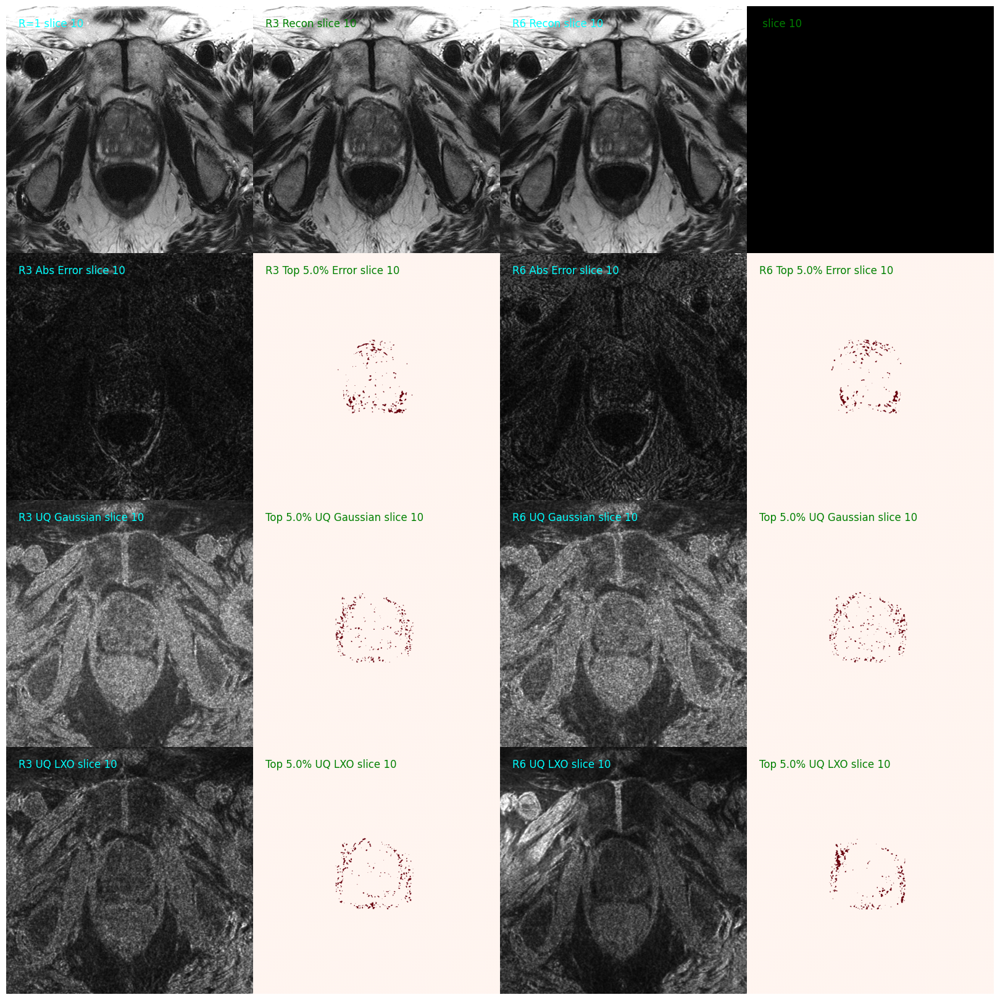

Figure saved to /scratch/hb-pca-rad/projects/04_uncertainty_quantification/figures_std_top5_v3/0010_ANON7748752_UQ_vs_ABS_slice10_R1_R3_R6_top5.png


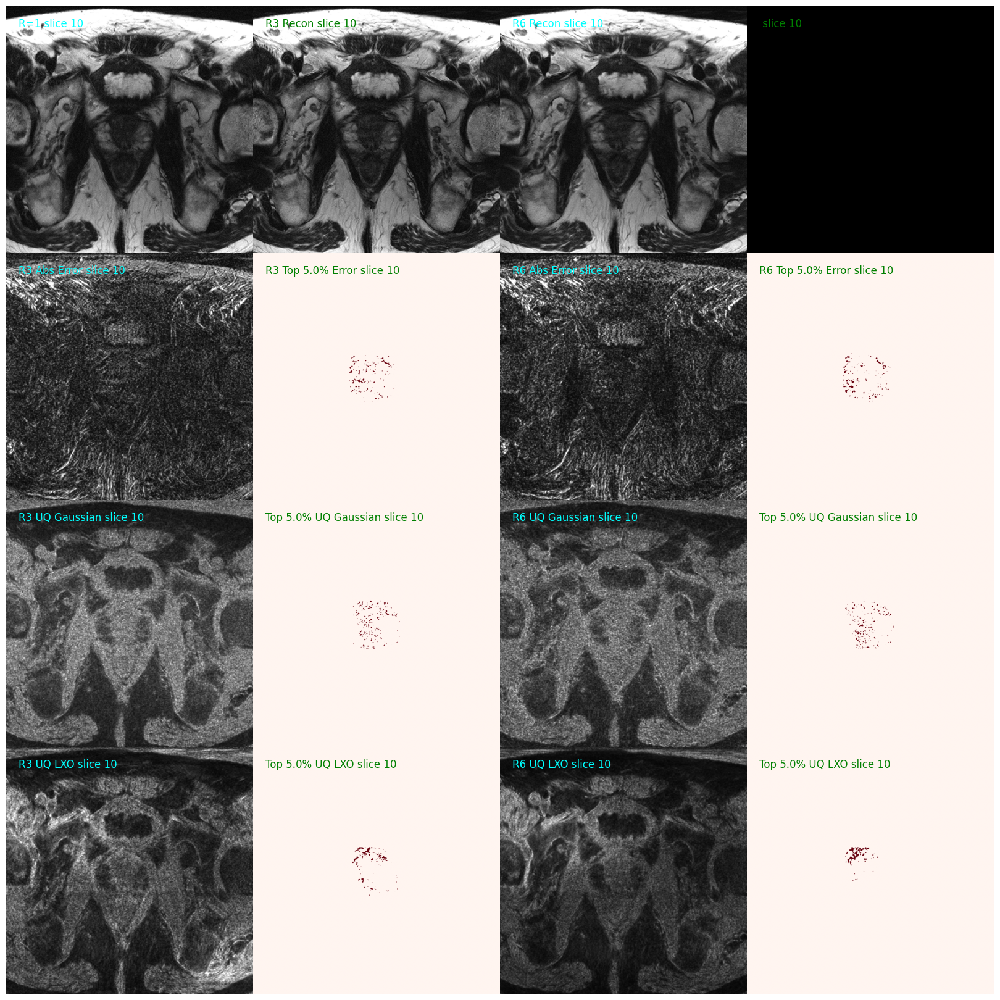

Figure saved to /scratch/hb-pca-rad/projects/04_uncertainty_quantification/figures_std_top5_v3/0012_ANON4982869_UQ_vs_ABS_slice10_R1_R3_R6_top5.png


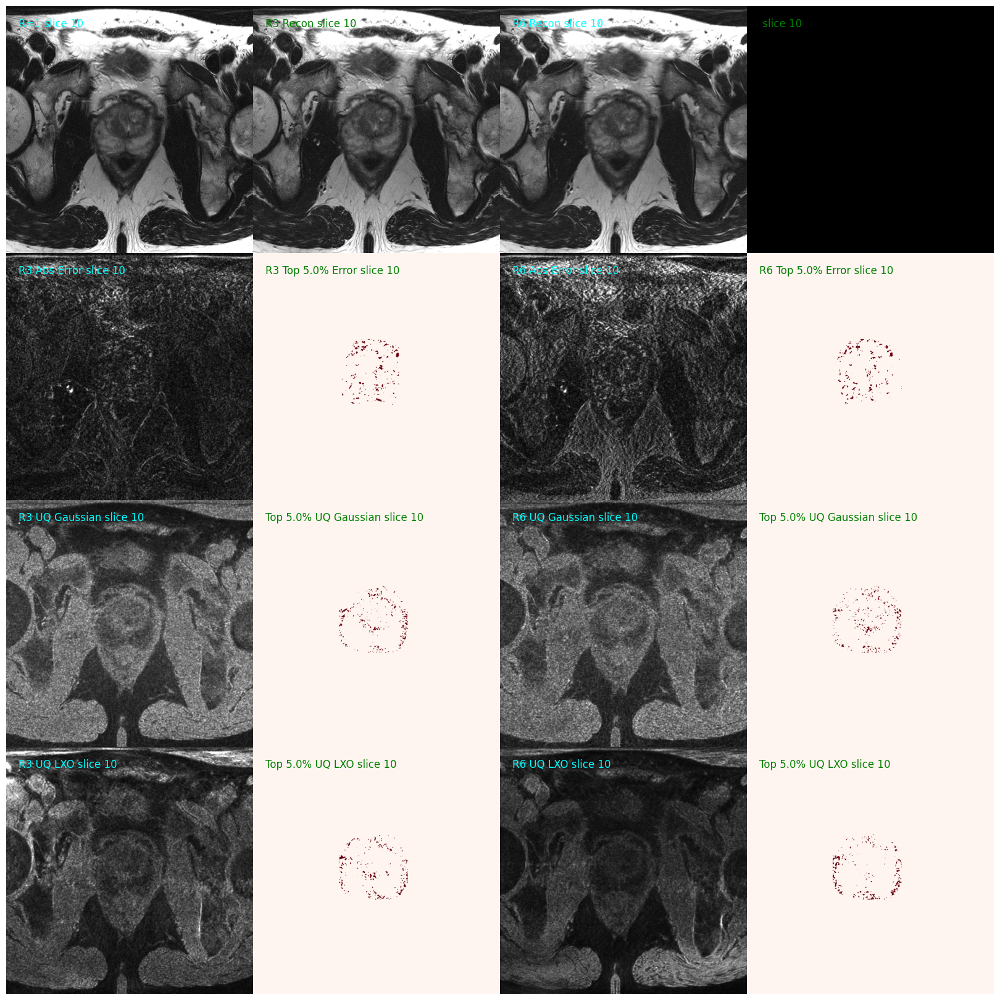

Figure saved to /scratch/hb-pca-rad/projects/04_uncertainty_quantification/figures_std_top5_v3/0013_ANON7362087_UQ_vs_ABS_slice10_R1_R3_R6_top5.png


In [27]:

def plot_topk_overlap_grid(
    pat_id: str,
    slice_idx: int,
    roots: Dict[str, Path],
    topk: float             = 5.0,    # 5% of the top-k pixels are considered for the mask.
    vlims: Dict[str, float] = None,
    do_blurring: bool       = True,
    do_adap_clip: bool      = True,
    do_show_now: bool       = True,
    figdir: Path            = None,

):
    pat_root = roots['reader_study'] / pat_id
    r1_img = sitk.ReadImage(str(pat_root / f"{pat_id}_rss_target_dcml.mha"))
    r1_arr = sitk.GetArrayFromImage(r1_img)

    r3_arr = sitk.GetArrayFromImage(sitk.ReadImage(str(pat_root / f"{pat_id}_VSharp_R3_recon_dcml.mha")))
    r6_arr = sitk.GetArrayFromImage(sitk.ReadImage(str(pat_root / f"{pat_id}_VSharp_R6_recon_dcml.mha")))

    r3_abs = np.abs(r1_arr - r3_arr)
    r6_abs = np.abs(r1_arr - r6_arr)
    r3_uq_g = sitk.GetArrayFromImage(sitk.ReadImage(str(roots["R3_recons_gaussian"] / pat_id / f"uq_map_R3_gaussian.nii.gz")))
    r6_uq_g = sitk.GetArrayFromImage(sitk.ReadImage(str(roots["R6_recons_gaussian"] / pat_id / f"uq_map_R6_gaussian.nii.gz")))
    r3_uq_l = sitk.GetArrayFromImage(sitk.ReadImage(str(roots["R3_recons_lxo"] / pat_id / f"uq_map_R3_lxo.nii.gz")))
    r6_uq_l = sitk.GetArrayFromImage(sitk.ReadImage(str(roots["R6_recons_lxo"] / pat_id / f"uq_map_R6_lxo.nii.gz")))

    if do_blurring:
        r3_abs = apply_gaussian_blur_3d(r3_abs)
        r6_abs = apply_gaussian_blur_3d(r6_abs)
        r3_uq_g = apply_gaussian_blur_3d(r3_uq_g)
        r6_uq_g = apply_gaussian_blur_3d(r6_uq_g)
        r3_uq_l = apply_gaussian_blur_3d(r3_uq_l)
        r6_uq_l = apply_gaussian_blur_3d(r6_uq_l)

    if do_adap_clip:    # Purely for visualization purposes, to make the images look better.
        r1_arr = adaptive_clip(r1_arr, 0, 95)
        r3_arr = adaptive_clip(r3_arr, 0, 95)
        r6_arr = adaptive_clip(r6_arr, 0, 95)

    # ---- prostate segmentation --------------------------------
    prost_seg_root = roots['reader_study_segs'] / f"{pat_id}_mlseg_total_mr.nii.gz"
    prost_seg_arr  = sitk.GetArrayFromImage(sitk.ReadImage(str(prost_seg_root))) # so this is a segmentation of many multi-label anatomical structures, where are interested in where it is the prostate=17
    prost_seg_arr  = np.where(prost_seg_arr == 17, 1, 0) # this is the prostate segmentation
    prost_seg_dil  = _dilate2d_fast(prost_seg_arr[slice_idx], radius=20, eight_conn=True)
    roi            = prost_seg_dil.astype(bool)        # use original if you prefer
    
    def _topk_in_roi(arr2d, roi2d, topk_pct):
        """Binary mask of top-k % voxels inside `roi2d`."""
        if roi2d.sum() == 0:                 # safety for empty slices
            return np.zeros_like(arr2d, dtype=bool)
        thresh = np.percentile(arr2d[roi2d], 100.0 - topk_pct)
        return (arr2d >= thresh) & roi2d

    # Top-k binary masks
    # r3_abs_mask = _get_topk_mask(r3_abs[slice_idx], 100.0-topk)
    # r6_abs_mask = _get_topk_mask(r6_abs[slice_idx], 100.0-topk)
    # r3_uq_g_mask = _get_topk_mask(r3_uq_g[slice_idx], 100.0-topk)
    # r6_uq_g_mask = _get_topk_mask(r6_uq_g[slice_idx], 100.0-topk)
    # r3_uq_l_mask = _get_topk_mask(r3_uq_l[slice_idx], 100.0-topk)
    # r6_uq_l_mask = _get_topk_mask(r6_uq_l[slice_idx], 100.0-topk)

    r3_abs_mask  = _topk_in_roi(r3_abs[slice_idx],  roi, topk)
    r6_abs_mask  = _topk_in_roi(r6_abs[slice_idx],  roi, topk)
    r3_uq_g_mask = _topk_in_roi(r3_uq_g[slice_idx], roi, topk)
    r6_uq_g_mask = _topk_in_roi(r6_uq_g[slice_idx], roi, topk)
    r3_uq_l_mask = _topk_in_roi(r3_uq_l[slice_idx], roi, topk)
    r6_uq_l_mask = _topk_in_roi(r6_uq_l[slice_idx], roi, topk)

    # 4x4 layout
    fig, axs = plt.subplots(4, 4, figsize=(16, 16))
    grid = [
        [r1_arr[slice_idx],  r3_arr[slice_idx], r6_arr[slice_idx],  np.zeros_like(r1_arr[slice_idx])],
        [r3_abs[slice_idx],  r3_abs_mask,       r6_abs[slice_idx],  r6_abs_mask],
        [r3_uq_g[slice_idx], r3_uq_g_mask,      r6_uq_g[slice_idx], r6_uq_g_mask],
        [r3_uq_l[slice_idx], r3_uq_l_mask,      r6_uq_l[slice_idx], r6_uq_l_mask],
    ]

    titles = [
        ["R=1",            "R3 Recon",                 "R6 Recon",       ""],
        ["R3 Abs Error",   f"R3 Top {topk}% Error",    "R6 Abs Error",   f"R6 Top {topk}% Error"],
        ["R3 UQ Gaussian", f"Top {topk}% UQ Gaussian", "R6 UQ Gaussian", f"Top {topk}% UQ Gaussian"],
        ["R3 UQ LXO",      f"Top {topk}% UQ LXO",      "R6 UQ LXO",      f"Top {topk}% UQ LXO"],
    ]

    for i in range(4):
        for j in range(4):
            vmin, vmax = None, None
            # Set vmin/vmax for continuous maps (cols 0 & 2 only)
            if j in [0, 2]:
                if i == 1:  # abs error maps
                    vmin, vmax = vlims['abs_error_vmin'], vlims['abs_error_vmax']
                elif i in [2, 3]:  # UQ maps
                    vmin, vmax = vlims['uq_vmin'], vlims['uq_vmax']

            cmap = 'Reds' if grid[i][j].dtype == bool else 'gray'
            axs[i, j].imshow(grid[i][j], cmap=cmap, vmin=vmin, vmax=vmax)
            axs[i, j].axis('off')
            # axs[i, j].set_title(titles[i][j], fontsize=10)
            if j in [1, 3]:
                axs[i, j].text(0.05, 0.95, f"{titles[i][j]} slice {slice_idx}", color='green', fontsize=12, transform=axs[i, j].transAxes, va='top')
            else:
                axs[i, j].text(0.05, 0.95, f"{titles[i][j]} slice {slice_idx}", color='cyan', fontsize=12, transform=axs[i, j].transAxes, va='top')

    # fig.suptitle(f"Top-{topk:.1f}% UQ/Error Voxels — {pat_id} slice {slice_idx}", fontsize=16)
    plt.tight_layout(pad=0)
    plt.subplots_adjust(wspace=0, hspace=0, left=0, right=1, top=1, bottom=0)

    figdir.mkdir(parents=True, exist_ok=True)
    save_path = figdir / f"{pat_id}_UQ_vs_ABS_slice{slice_idx}_R1_R3_R6_top{int(topk)}.png"
    fig.savefig(save_path, bbox_inches='tight', pad_inches=0)
    if do_show_now:
        plt.show()
    plt.close(fig)
    print(f"Figure saved to {save_path}")


###############################################
# Main execution
###############################################
topk = 5.0     # as in TOP K percentage mask will be shown of the pixel values of the image.

vlims = {                             # Determined from the database query above, but can also be set manually.
    'abs_error_vmin': 0,       #6.0,    # determined from DB
    'abs_error_vmax': 75,      #41.0,   # determined from DB
    'uq_vmin':        0,       #0.0003, # determined from DB
    'uq_vmax':        0.20,    #0.003,  # determined from DB
}

for pat_id in PAT_IDS:
    plot_topk_overlap_grid(
        pat_id       = pat_id,
        slice_idx    = EXAMPLE_SLICE_IDX,
        roots        = ROOTS,
        topk         = topk,           # Top 5%
        vlims        = vlims,
        do_blurring  = DO_BLURRING,
        do_adap_clip = DO_ADAP_CLIP,
        do_show_now  = True,
        figdir       = Path(f"/scratch/hb-pca-rad/projects/04_uncertainty_quantification/figures_std_top{int(topk)}_v3"),
    )

# TopK metrics

Inputs Needed (Per Slice)
abs_error_map: 2D array (already blurred)

uq_map: 2D array from Gaussian or LXO (already blurred)

k_percent: e.g., 5, 10, or 15

mask: optional (e.g., restrict to prostate or lesion)


| Metric       | Formula             |       |   |   |                                  |
| ------------ | ------------------- | ----- | - | - | -------------------------------- |
| Dice         | \`2 \* (A ∩ B) / (  | A     | + | B | )\`                              |
| IoU          | `(A ∩ B) / (A ∪ B)` |       |   |   |                                  |
| Precision\@k | \`                  | A ∩ B | / | B | \` (B = UQ mask, A = Error mask) |
| Recall\@k    | \`                  | A ∩ B | / | A | \`                               |


Metadata to Record
pat_id, slice_idx, acc_factor, uq_method, k_percent

Optionally: region, if mask is applied

A single-row dict per slice:
{
  'pat_id': ...,
  'slice_idx': ...,
  'acc_factor': ...,
  'uq_method': ...,
  'k_percent': 10,
  'dice': ...,
  'iou': ...,
  'precision': ...,
  'recall': ...
}

In [ ]:
def compute_topk_overlap_metrics(
    abs_map: np.ndarray,
    uq_map: np.ndarray,
    pat_id: str,
    slice_idx: int,
    acc_factor: int,
    uq_method: str,
    k_percent: float = 10.0,
    region_mask: Optional[np.ndarray] = None
) -> Dict:

    # Optional: restrict to ROI
    if region_mask is not None:
        abs_vals = abs_map[region_mask]
        uq_vals  = uq_map[region_mask]
    else:
        abs_vals = abs_map.flatten()
        uq_vals  = uq_map.flatten()

    # Skip if region is empty
    if abs_vals.size == 0:
        return None

    # Compute top-k thresholds
    abs_thresh = np.percentile(abs_vals, 100 - k_percent)
    uq_thresh  = np.percentile(uq_vals, 100 - k_percent)

    # Binarize
    abs_mask = abs_vals > abs_thresh
    uq_mask  = uq_vals > uq_thresh

    # Overlap
    intersection = np.logical_and(abs_mask, uq_mask).sum()
    union        = np.logical_or(abs_mask, uq_mask).sum()

    # Safe counts
    abs_sum = abs_mask.sum()
    uq_sum  = uq_mask.sum()

    # Metrics
    dice = 2 * intersection / (abs_sum + uq_sum) if (abs_sum + uq_sum) else 0.0
    iou  = intersection / union if union else 0.0
    precision = intersection / uq_sum if uq_sum else 0.0
    recall    = intersection / abs_sum if abs_sum else 0.0

    return {
        'pat_id': str(pat_id),
        'slice_idx': int(slice_idx),
        'acc_factor': int(acc_factor),
        'uq_method': str(uq_method),
        'k_percent': float(k_percent),
        'dice': float(dice),
        'iou': float(iou),
        'precision': float(precision),
        'recall': float(recall),
    }


In [109]:
def batch_compute_topk_metrics(
    pat_ids: List[str],
    acc_factors: List[int],
    uq_methods: List[str],
    k_percent: float,
    roots: Dict[str, Path],
    do_blurring: bool = True,
    regions_mask_type: List[str] = ['slice']  # "slice", "prostate", "lesion", or None
) -> pd.DataFrame:

    all_rows = []
    for pat_id in pat_ids:
        print(f"🧪 Processing patient {pat_id}...")

        # --- Load base images ---
        pat_root = roots['reader_study'] / pat_id
        r1_img = sitk.ReadImage(str(pat_root / f"{pat_id}_rss_target_dcml.mha"))
        r1_arr = sitk.GetArrayFromImage(r1_img)

        # --- Optional ROI Mask ---
        lesion_mask, prostate_mask = None, None
        if regions_mask_type == "prostate":
            seg = sitk.GetArrayFromImage(sitk.ReadImage(str(roots["reader_study_segs"] / f"{pat_id}_mlseg_total_mr.nii.gz")))
            prostate_mask = (seg == 17)
        elif regions_mask_type == "lesion":
            lesion_mask, _ = _get_combined_rois_array(pat_root, r1_img, r1_arr)

        for acc in acc_factors:
            for uq_method in uq_methods:
                uq_root = roots[f"R{acc}_recons_{uq_method}"]
                uq_path = uq_root / pat_id / f"uq_map_R{acc}_{uq_method}.nii.gz"
                uq_arr = sitk.GetArrayFromImage(sitk.ReadImage(str(uq_path)))

                recon_path = pat_root / f"{pat_id}_VSharp_R{acc}_recon_dcml.mha"
                recon_arr = sitk.GetArrayFromImage(sitk.ReadImage(str(recon_path)))
                abs_arr = np.abs(r1_arr - recon_arr)

                # Optional: blur
                if do_blurring:
                    abs_arr = apply_gaussian_blur_3d(abs_arr, sigma_xy=1.0, sigma_z=0.0)
                    uq_arr = apply_gaussian_blur_3d(uq_arr, sigma_xy=1.0, sigma_z=0.0)

                for i in range(abs_arr.shape[0]):
                    if regions_mask_type == "prostate":
                        mask = prostate_mask[i]
                    elif regions_mask_type == "lesion":
                        mask = lesion_mask[i]
                    else:
                        mask = None

                    result = compute_topk_overlap_metrics(
                        abs_map=abs_arr[i],
                        uq_map=uq_arr[i],
                        pat_id=pat_id,
                        slice_idx=i,
                        acc_factor=acc,
                        uq_method=uq_method,
                        k_percent=k_percent,
                        region_mask=mask
                    )
                    if result:
                        result["region"] = str(regions_mask_type if regions_mask_type else "slice")
                        all_rows.append(result)

    return pd.DataFrame(all_rows)


def store_topk_metrics_to_db(
    df_topk: pd.DataFrame,
    db_fpath: Path,
    table_name: str = "uq_vs_abs_topk_metrics",
    debug: bool = False
):
    """
    Stores a DataFrame of top-k overlap metrics into a SQLite database.

    Args:
        df_topk (pd.DataFrame): DataFrame with computed metrics.
        db_fpath (Path): Path to the SQLite database file.
        table_name (str): Target table name.
        debug (bool): If True, drop table before storing.
    """
    final_table = f"{table_name}_debug" if debug else table_name

    with sqlite3.connect(str(db_fpath)) as conn:
        cursor = conn.cursor()
        if debug:
            print(f"🧨 Dropping table '{final_table}'...")
            cursor.execute(f"DROP TABLE IF EXISTS {final_table}")
            conn.commit()

        print(f"💾 Writing metrics to table '{final_table}' in {db_fpath}...")
        df_topk.to_sql(final_table, conn, if_exists="replace", index=False)
        print(f"✅ Done — {len(df_topk)} rows written.")


def create_topk_table_if_not_exists(
    db_fpath: Path,
    table_name: str = "uq_vs_abs_topk_metrics",
    debug: bool = False
) -> str:
    """
    Ensures the SQLite table exists with correct schema.

    Returns the final table name (with '_debug' suffix if debug is True).
    """
    final_table = f"{table_name}_debug" if debug else table_name

    schema = f"""
    CREATE TABLE IF NOT EXISTS {final_table} (
        pat_id TEXT,
        slice_idx INTEGER,
        acc_factor INTEGER,
        uq_method TEXT,
        k_percent REAL,
        region TEXT,
        dice REAL,
        iou REAL,
        precision REAL,
        recall REAL
    );
    """

    with sqlite3.connect(str(db_fpath)) as conn:
        cursor = conn.cursor()
        cursor.execute(schema)
        conn.commit()

    print(f"📐 Table '{final_table}' is ready in {db_fpath}")
    return final_table


###############################################
# Main execution
###############################################
df_topk = batch_compute_topk_metrics(
    pat_ids           = PAT_IDS,
    acc_factors       = ACC_FACTORS,
    uq_methods        = UQ_METHODS,
    k_percent         = 10.0,
    roots             = ROOTS,
    do_blurring       = DO_BLURRING,
    regions_mask_type = REGIONS
)

# Print all data types in the df_topk DataFrame
for col, dtype in df_topk.dtypes.items():
    print(f"Column '{col}' has dtype: {dtype}")

# lets pritn the values of the first row
for col, value in df_topk.iloc[0].items():
    print(f"Column '{col}' has value: {value} (type: {type(value)})")


# Only ensure table exists if NOT dropping it in debug mode
if not DEBUG:
    create_topk_table_if_not_exists(
        db_fpath   = ROOTS["db_fpath_new"],
        table_name = "uq_vs_abs_topk_metrics",
        debug      = False
    )

store_topk_metrics_to_db(
    df_topk    = df_topk,
    db_fpath   = ROOTS["db_fpath_new"],
    table_name = "uq_vs_abs_topk_metrics",
    debug      = DEBUG
)


🧪 Processing patient 0003_ANON5046358...
🧪 Processing patient 0004_ANON9616598...
🧪 Processing patient 0005_ANON8290811...
🧪 Processing patient 0006_ANON2379607...
🧪 Processing patient 0007_ANON1586301...
🧪 Processing patient 0008_ANON8890538...
🧪 Processing patient 0010_ANON7748752...
🧪 Processing patient 0011_ANON1102778...
🧪 Processing patient 0012_ANON4982869...
🧪 Processing patient 0013_ANON7362087...
🧪 Processing patient 0014_ANON3951049...
🧪 Processing patient 0015_ANON9844606...
🧪 Processing patient 0018_ANON9843837...
🧪 Processing patient 0019_ANON7657657...
🧪 Processing patient 0020_ANON1562419...
🧪 Processing patient 0021_ANON4277586...
🧪 Processing patient 0023_ANON6964611...
🧪 Processing patient 0024_ANON7992094...
🧪 Processing patient 0026_ANON3620419...
🧪 Processing patient 0027_ANON9724912...
🧪 Processing patient 0028_ANON3394777...
🧪 Processing patient 0029_ANON7189994...
🧪 Processing patient 0030_ANON3397001...
🧪 Processing patient 0031_ANON9141039...
🧪 Processing pat

# Load the top-k metrics from SQLite and summarizes performance by uq_method and acc_factor

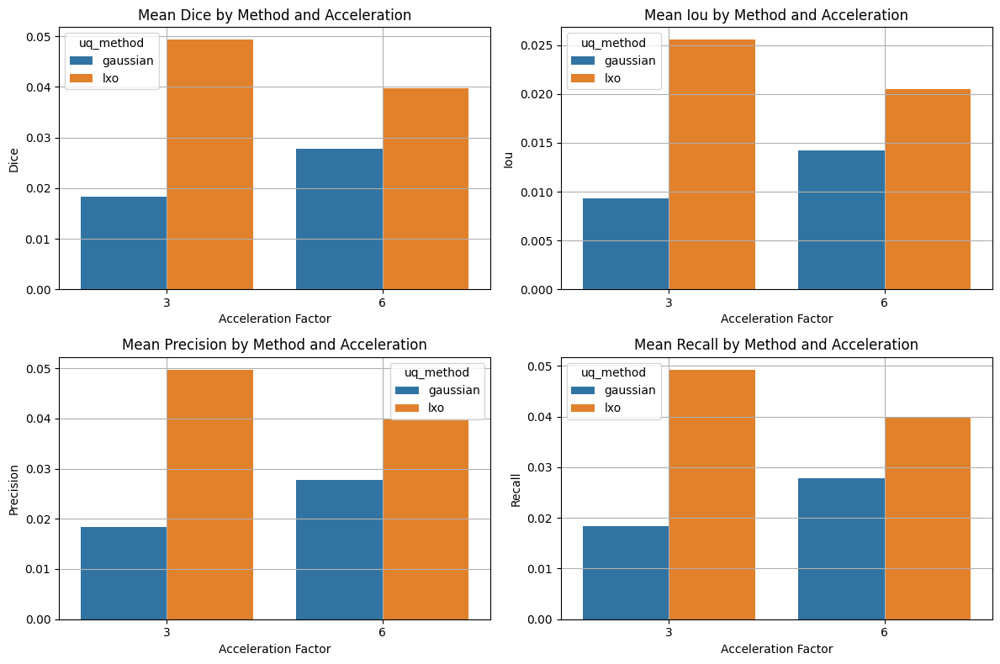

In [111]:
import seaborn as sns

# === Load Data from DB ===
conn = sqlite3.connect(str(ROOTS['db_fpath_new']))  # Update path
query = """
SELECT * FROM uq_vs_abs_topk_metrics_debug
"""
df_topk = pd.read_sql(query, conn)
conn.close()

# === Clean Region Column ===
df_topk["region"] = df_topk["region"].str.strip("[]'")

# === Summarize by Method and Acceleration ===
summary = df_topk.groupby(["uq_method", "acc_factor"]).agg({
    "dice": "mean",
    "iou": "mean",
    "precision": "mean",
    "recall": "mean"
}).reset_index()

# === Plot Bar Charts ===
fig, axes = plt.subplots(2, 2, figsize=(12, 8))
metrics = ["dice", "iou", "precision", "recall"]

for ax, metric in zip(axes.flat, metrics):
    sns.barplot(data=summary, x="acc_factor", y=metric, hue="uq_method", ax=ax)
    ax.set_title(f"Mean {metric.capitalize()} by Method and Acceleration")
    ax.set_ylabel(metric.capitalize())
    ax.set_xlabel("Acceleration Factor")
    ax.grid(True)

plt.tight_layout()
plt.show()

# Experiment with the Blurring Settings before calculating the Uncertainty

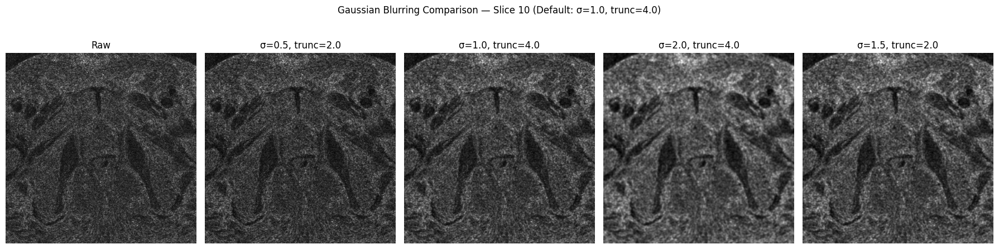

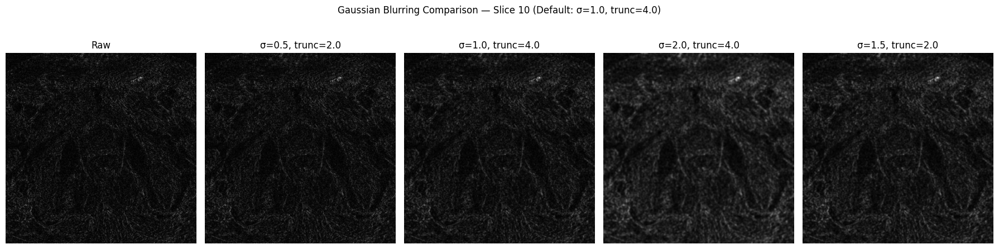

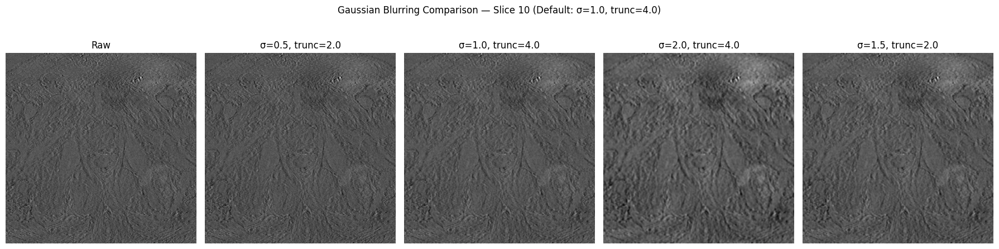

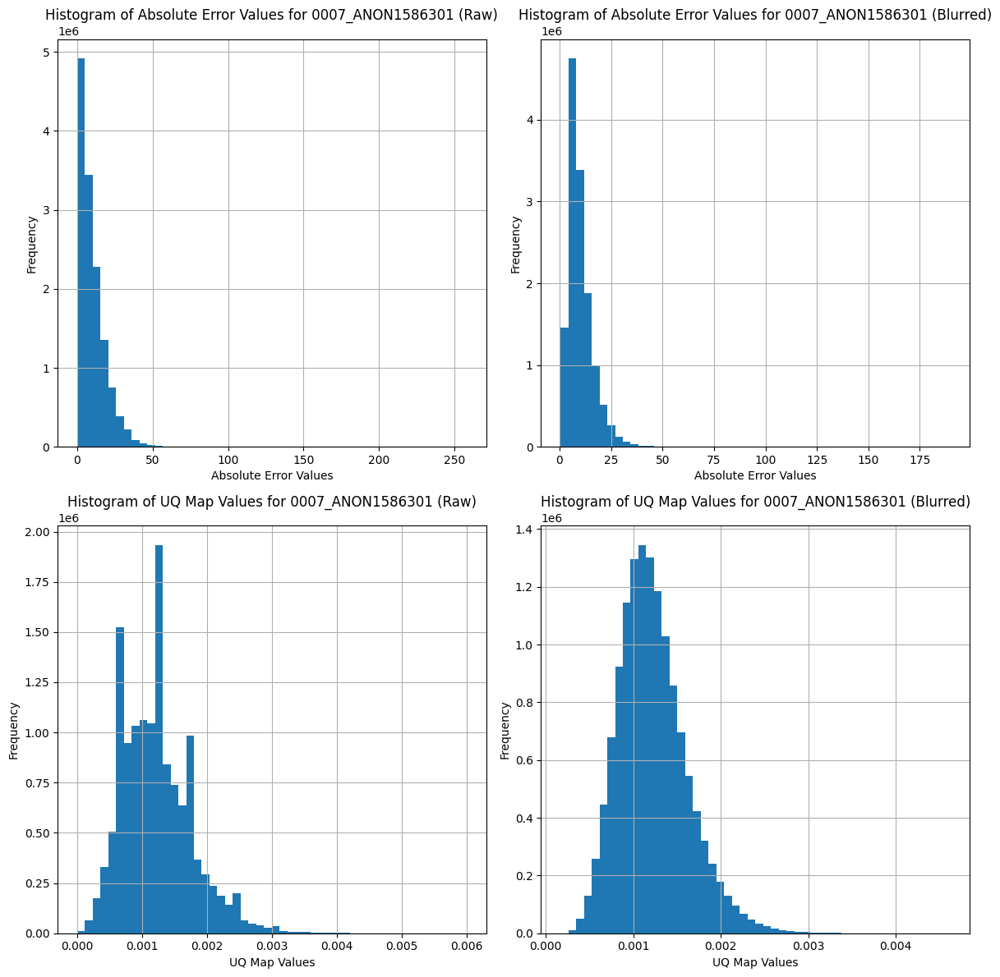

In [ ]:
def compare_gaussian_blur_settings(volume: np.ndarray, slice_idx: int, sigma_z: float = 0.0):
    """
    Compare raw image and multiple Gaussian blur parameter settings on a single slice.

    Parameters:
        volume (np.ndarray): 3D volume (slices, H, W)
        slice_idx (int): Index of slice to visualize
        sigma_z (float): Fixed sigma for through-plane blurring (usually 0)

    Returns:
        None (displays figure)
    """
    from scipy.ndimage import gaussian_filter
    import matplotlib.pyplot as plt

    # Blur parameter settings: (sigma_xy, truncate)
    settings = [
        ("Raw", None, None),
        ("σ=0.5, trunc=2.0", 0.5, 2.0),
        ("σ=1.0, trunc=4.0", 1.0, 4.0),  # Default
        ("σ=2.0, trunc=4.0", 2.0, 4.0),
        ("σ=1.5, trunc=2.0", 1.5, 2.0),
    ]

    fig, axs = plt.subplots(1, len(settings), figsize=(18, 5))
    for i, (label, sigma_xy, truncate) in enumerate(settings):
        if sigma_xy is None:
            img = volume[slice_idx]
        else:
            img = gaussian_filter(volume, sigma=(sigma_z, sigma_xy, sigma_xy), truncate=truncate)[slice_idx]
        axs[i].imshow(img, cmap='gray')
        axs[i].axis('off')
        axs[i].set_title(label)

    plt.suptitle(f"Gaussian Blurring Comparison — Slice {slice_idx} (Default: σ=1.0, trunc=4.0)")
    plt.tight_layout()
    plt.show()



pat_id   = '0007_ANON1586301'
idx      = 10
pat_root = ROOTS['reader_study'] / pat_id

# R1 Loading
r1_img            = sitk.ReadImage(str(pat_root / f"{pat_id}_rss_target_dcml.mha"))
r1_arr            = sitk.GetArrayFromImage(r1_img)

# R3 Loading Base
r6_arr            = sitk.GetArrayFromImage(sitk.ReadImage(str(pat_root / f"{pat_id}_VSharp_R6_recon_dcml.mha")))

# Abs error
r6_abs_error_arr  = np.abs(r1_arr - r6_arr)
r6_abs_error_blu_arr = apply_gaussian_blur_3d(r6_abs_error_arr, sigma_xy=1.0, sigma_z=0.0)
r6_error_arr      = r1_arr - r6_arr
r6_error_blu_arr = apply_gaussian_blur_3d(r6_error_arr, sigma_xy=1.0, sigma_z=0.0)

# Uncertainty Quantification Map
r6_uq_map_arr     = sitk.GetArrayFromImage(sitk.ReadImage(str(ROOTS["R6_gaussian"] / pat_id / f"uq_map_R6_gm25.nii.gz")))
r6_uq_map_blu_arr = apply_gaussian_blur_3d(r6_uq_map_arr, sigma_xy=1.0, sigma_z=0.0)

# Compare diffent Gaussian blur settings
compare_gaussian_blur_settings(r6_uq_map_arr, slice_idx=idx)
compare_gaussian_blur_settings(r6_abs_error_arr, slice_idx=idx)
compare_gaussian_blur_settings(r6_error_arr, slice_idx=idx)

# lets make 4 histograms, first row 2 histograms of the abs error map hist raw and blurred, second row 2 histograms of the uq map hist raw and blurred
fig, axs = plt.subplots(2, 2, figsize=(12, 12))
axs[0, 0].hist(r6_abs_error_arr.flatten(), bins=50)
axs[0, 0].set_xlabel("Absolute Error Values")
axs[0, 0].set_ylabel("Frequency")
axs[0, 0].set_title(f"Histogram of Absolute Error Values for {pat_id} (Raw)")
axs[0, 0].grid()
axs[0, 1].hist(r6_abs_error_blu_arr.flatten(), bins=50)
axs[0, 1].set_xlabel("Absolute Error Values")
axs[0, 1].set_ylabel("Frequency")
axs[0, 1].set_title(f"Histogram of Absolute Error Values for {pat_id} (Blurred)")
axs[0, 1].grid()
axs[1, 0].hist(r6_uq_map_arr.flatten(), bins=50)
axs[1, 0].set_xlabel("UQ Map Values")
axs[1, 0].set_ylabel("Frequency")
axs[1, 0].set_title(f"Histogram of UQ Map Values for {pat_id} (Raw)")
axs[1, 0].grid()
axs[1, 1].hist(r6_uq_map_blu_arr.flatten(), bins=50)
axs[1, 1].set_xlabel("UQ Map Values")
axs[1, 1].set_ylabel("Frequency")
axs[1, 1].set_title(f"Histogram of UQ Map Values for {pat_id} (Blurred)")
axs[1, 1].grid()
plt.tight_layout()
plt.show()


# Lets do a dilation test

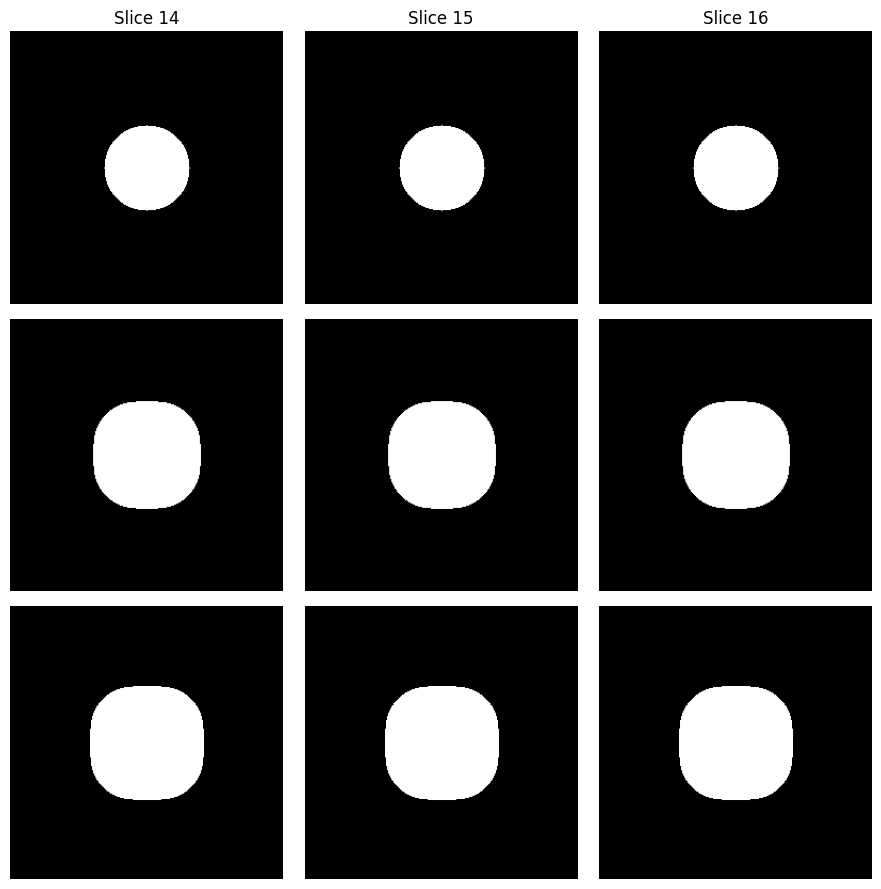

In [ ]:
# ---------- fast dilation helpers ----------
def dilate2d_fast(mask2d: np.ndarray,
                  radius: int = 3,
                  eight_conn: bool = False) -> np.ndarray:
    """Binary dilation of a 2-D slice (square footprint)."""
    assert mask2d.ndim == 2
    if eight_conn:
        footprint = np.ones((2*radius+1, 2*radius+1), dtype=bool)
    else:  # 4-connected cross
        eye = np.eye(2*radius+1, dtype=bool)
        footprint = eye | eye[::-1]
    return binary_dilation(mask2d, structure=footprint).astype(np.uint8)

def dilate3d_fast(mask3d: np.ndarray,
                  inplane_pct: float = 0.05,
                  slice_dilation: int = 1,
                  eight_conn: bool = False) -> np.ndarray:
    """One-pass 3-D dilation: ±slice_dilation in z, % pad in-plane."""
    assert mask3d.ndim == 3
    S, H, W = mask3d.shape
    r = max(1, int(round(min(H, W) * inplane_pct)))
    # rectangular footprint
    footprint = np.ones((2*slice_dilation+1, 2*r+1, 2*r+1), dtype=bool)
    if not eight_conn:
        footprint[:, :, :] = False
        # in-plane cross on centre slice
        eye = np.eye(2*r+1, dtype=bool)
        footprint[slice_dilation, :, :] = eye | eye[::-1]
        # line through z
        footprint[:, r, r] = True
    return binary_dilation(mask3d.astype(bool), structure=footprint).astype(np.uint8)

# ---------- synthetic 3-D prostate mask (test demo) ----------
vol = np.zeros((30, 256, 256), dtype=np.uint8)
zz = slice(10, 20)
yy, xx = np.ogrid[:256, :256]
circle = (yy-128)**2 + (xx-128)**2 <= 40**2
for z in range(*zz.indices(vol.shape[0])):
    vol[z][circle] = 1  # simple cylindrical prostate

# fast dilations
vol_2d = np.stack([dilate2d_fast(vol[z], radius=10, eight_conn=True) for z in range(vol.shape[0])])
vol_3d = dilate3d_fast(vol, inplane_pct=0.05, slice_dilation=1, eight_conn=True)

# ---------- visualisation ----------
slices_to_show = [14, 15, 16]  # three example slices
fig, axes = plt.subplots(3, 3, figsize=(9, 9))
titles = ["Original", "2-D dilated", "3-D dilated"]
for col, sl in enumerate(slices_to_show):
    axes[0, col].imshow(vol[sl], cmap='gray')
    axes[1, col].imshow(vol_2d[sl], cmap='gray')
    axes[2, col].imshow(vol_3d[sl], cmap='gray')
    for row in range(3):
        axes[row, col].axis('off')
    axes[0, col].set_title(f"Slice {sl}")
for row in range(3):
    axes[row, 0].set_ylabel(titles[row], rotation=90, va='center')
plt.tight_layout()
plt.show()


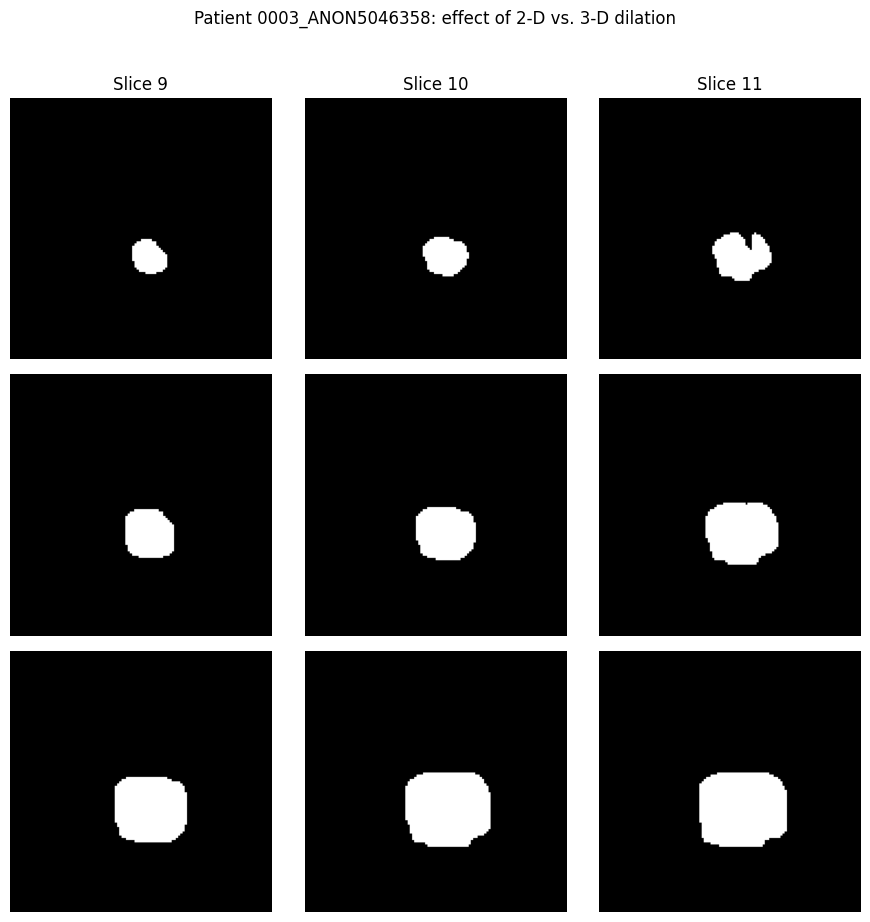

In [12]:

# ---------------------------------------------------------------------
# Main loop over patients ---------------------------------------------
# ---------------------------------------------------------------------
for pat_id in PAT_IDS:
    # ----------------- load the prostate segmentation ----------------
    prost_seg_root = Path(
        '/scratch/hb-pca-rad/projects/03_reader_set_v2/segs'
    ) / f"{pat_id}_mlseg_total_mr.nii.gz"

    prost_seg_arr = sitk.GetArrayFromImage(sitk.ReadImage(str(prost_seg_root)))
    prost_seg_arr = (prost_seg_arr == 17).astype(np.uint8)        # 17 = prostate label

    # ----------------- fast dilations --------------------------------
    dilated_2d  = np.stack(
        [dilate2d_fast(prost_seg_arr[z], radius=20, eight_conn=True)
         for z in range(prost_seg_arr.shape[0])]
    )

    dilated_3d = dilate3d_fast(
        prost_seg_arr,
        inplane_pct=0.05,
        slice_dilation=1,
        eight_conn=True
    )

    # ----------------- visualisation (three matched slices) ----------
    # choose three consecutive slices centred on EXAMPLE_SLICE_IDX
    centre = EXAMPLE_SLICE_IDX
    sl_ids = [centre-1, centre, centre+1]

    fig, axes = plt.subplots(3, 3, figsize=(9, 9))
    row_titles = ["Original", "2-D dilated", "3-D dilated"]

    for col, sl in enumerate(sl_ids):
        axes[0, col].imshow(prost_seg_arr[sl], cmap='gray')
        axes[1, col].imshow(dilated_2d[sl], cmap='gray')
        axes[2, col].imshow(dilated_3d[sl], cmap='gray')
        for row in range(3):
            axes[row, col].axis('off')
        axes[0, col].set_title(f"Slice {sl}")

    for row in range(3):
        axes[row, 0].set_ylabel(row_titles[row], rotation=90, va='center')

    plt.suptitle(f"Patient {pat_id}: effect of 2-D vs. 3-D dilation", y=1.02)
    plt.tight_layout()
    plt.show()

Lets visualize the slice in one grid so that i can see what happens in 3d.

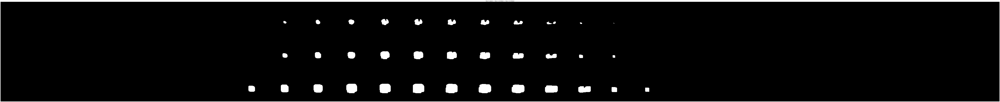

In [ ]:

# ------------------------------------------------------------------
# Build a long mosaic: S slices tiled horizontally, 3 rows vertically
# ------------------------------------------------------------------
S, H, W = prost_seg_arr.shape

row_orig = np.concatenate([prost_seg_arr[z] for z in range(S)], axis=1)
row_2d   = np.concatenate([dilated_2d[z]    for z in range(S)], axis=1)
row_3d   = np.concatenate([dilated_3d[z]    for z in range(S)], axis=1)

# stack rows: (3H, S·W)
mosaic = np.concatenate([row_orig, row_2d, row_3d], axis=0)

# ------------------------------------------------------------------
# Visualise
# ------------------------------------------------------------------
plt.figure(figsize=(mosaic.shape[1]/100, mosaic.shape[0]/100))
plt.imshow(mosaic, cmap='gray')
plt.axis('off')
plt.title("Row 0: original   |   Row 1: 2-D dilated   |   Row 2: 3-D dilated")
plt.show()
